Compare different community finding algorithms on the “classical”
computer generated test bed and on a few real networks.


Details:


• The computer generated test bed is defined as follows: consider
4 groups of nodes with 32 members each, these correspond to
the communities the algorithms should find. The links are drawn
between the nodes at random, however the average number of
links going from one node to other nodes in its own community
is given by z_in, whereas the average number of links going to the
rest of the network is given by z_out, and z_in and z_out always add
up to z_in + z_out = ⟨k⟩ = 16. When z_out is small and z_in is close
to 16, the algorithms have an easy job, the communities can be
spotted even by eye, since they the links are very dense inside and
occur very rarely in between the communities. However, as z_out
is increased the communities become less and less well defined,
and around zout = 8 the graph becomes homogeneous.



• The evaluation of the community finding results is based on a
matching between the predefined 4 groups and the found communities. Choose the matching which gives the highest number
of correctly classified nodes. (E.g., index the original groups by
A, B, C, D, then index the found communities also with A, B, C, D,
and search for the permutation of these indices maximizing the
number of nodes on which the two community index is the same).


• Plot the ratio of correctly classified nodes over the total number
of nodes as a function of zout. Also show figures about the found
communities in the test graph and in the real networks.

In [1]:
import gc
import random
import time
from itertools import permutations

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from cdlib import algorithms
from cdlib.classes.node_clustering import NodeClustering
from networkx.classes import Graph
from sklearn.metrics.cluster import adjusted_mutual_info_score, mutual_info_score

Note: to be able to use all crisp methods, you need to install some additional packages:  {'graph_tool', 'bayanpy', 'infomap'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'pyclustering', 'ASLPAw'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap'}


In [2]:
def get_group(node: str) -> str:
    return node[:2]


def get_custom_pos(graph) -> dict:
    custom_pos = {}
    nodes = list(graph.nodes())

    hoz_d = 0.3
    ver_d = 0.3
    hoz_gap = (2 - hoz_d) / (2 * 8)
    ver_gap = (2 - ver_d) / (2 * 4)

    for node in nodes:
        g = node.split("-")
        group_num = int(g[0][1]) - 1
        group_idx = int(g[1])
        group_num, group_idx

        x_pos = (group_num % 2) * (hoz_d + hoz_gap * 8)
        y_pos = (group_num // 2) * (ver_d + ver_gap * 4)

        x_pos = x_pos + (group_idx % 8) * hoz_gap
        y_pos = y_pos + (group_idx // 8) * ver_gap
        custom_pos[node] = [x_pos, y_pos]
    return custom_pos


def generate_4_neighbors_graph(p_in: float, neighbor_size: int = 32, k: int = 16):
    """
    Generate a 4-neighbor graph based on p_in
    """
    N = neighbor_size * 4

    # Generate 4 neighbors
    groups: list[nx.Graph] = []
    for _ in range(4):
        groups.append(nx.generators.gnp_random_graph(n=neighbor_size, p=p_in))

    # Merge 4 neighbors into 1 graph
    graph = nx.union_all(groups, rename=("G1-", "G2-", "G3-", "G4-"))

    # Calculate the remaining number of edges to achieve k = 16
    num_possible_edges = k * N / 2 - len(graph.edges)

    # Add the remaining out-neighbor edges
    nodes = list(graph.nodes)
    while True:
        if num_possible_edges == 0:
            break

        source, target = random.choices(nodes, k=2)
        if get_group(source) == get_group(target):
            continue

        graph.add_edge(source, target)
        num_possible_edges -= 1

    return graph


def get_in_neighbor_degree(graph: Graph):
    """
    Calculate the average in-neighbor degree of a graph
    """
    in_neighbor_edges = {node: [] for node in graph.nodes}
    for edge in graph.edges:
        source, target = edge
        if get_group(source) != get_group(target):
            # Skip all out-neighbor edges
            continue

        in_neighbor_edges[source].append(target)
        in_neighbor_edges[target].append(source)

    in_edges = [len(in_neighbor) for in_neighbor in in_neighbor_edges.values()]
    return sum(in_edges) / len(in_edges)


def get_out_neighbor_degree(graph: Graph):
    """
    Calculate the average in-neighbor degree of a graph
    """
    out_neighbor_edges = {node: [] for node in graph.nodes}
    for edge in graph.edges:
        source, target = edge
        if get_group(source) == get_group(target):
            # Skip all in-neighbor edges
            continue

        out_neighbor_edges[source].append(target)
        out_neighbor_edges[target].append(source)

    out_edges = [len(out_neighbor) for out_neighbor in out_neighbor_edges.values()]
    return sum(out_edges) / len(out_edges)


def get_average_degree(graph: nx.Graph):
    """
    Calculate the average degree <k> of a graph
    """
    return sum(degree for _, degree in graph.degree()) / len(graph.nodes())


def get_p_in(z_out: int, neighbor_size: int = 32, k: int = 16):
    """
    Calculate p in based on z_out, neighbor size, and average degree <k>
    """
    z_in = k - z_out
    return z_in / (neighbor_size - 1)


def get_graph_groups(graph: Graph):
    """
    Get groups of a given graph as a list of sets, which contain all nodes in the same community.
    Eg: [{1,2,3}, {4,5,6}, {7,8}]
    1,2,3 in a same community
    4,5,6 in a same community
    7,8 in a same community
    """
    groups = {}
    for node in graph.nodes:
        group = get_group(node)
        if group not in groups:
            groups[group] = set()
        groups[group].add(node)

    return list(groups.values())


def get_correct_classifications(graph_groups, community: NodeClustering):
    """
    Calculate the number of correct classification based on a set of graph groups and a set of communities
    Find permutation of graph groups instead because it is usually smaller
    """
    max_classification = -1
    communities_permutation = permutations(community.communities, len(graph_groups))
    for communities in communities_permutation:
        classification_count = 0
        for graph_group, sub_community in zip(graph_groups, communities):
            classification_count += len(graph_group.intersection(sub_community))
        max_classification = max(max_classification, classification_count)
    return max_classification


def generates_graphs(number_of_graphs: int, z_out: int):
    """
    Generate {number_of_graphs} of graphs with given {z_out}
    """
    graphs = []
    for _ in range(number_of_graphs):
        graphs.append(generate_4_neighbors_graph(get_p_in(z_out=z_out)))
    return graphs


def draw_comms(
    graph: Graph, pos, *, comms: NodeClustering = None, comms_set=None, node_size=200
):
    if not comms_set:
        comms_set = [set(sub_community) for sub_community in comms.communities]
    nx.draw_networkx_edges(graph, pos)
    number_of_comms = len(comms_set)
    cmap = plt.get_cmap(lut=number_of_comms * 1.5, name="hsv")
    for i, comm in enumerate(comms_set):
        nx.draw_networkx_nodes(
            graph,
            pos,
            nodelist=[node for node in graph.nodes() if node in comm],
            node_color=cmap(i / number_of_comms),
            node_size=node_size,
        )


def get_alg_comm_groups(community: NodeClustering):
    comm_groups = {}
    for i, com in enumerate(community.communities):
        for node in com:
            comm_groups[node] = i
    return comm_groups


def extract_labels_from_groups(ground_truth_groups: dict, alt_comm_groups: dict):
    labels_true = []
    labels_pred = []
    for node in graph.nodes:
        labels_true.append(ground_truth_groups[node])
        labels_pred.append(alt_comm_groups[node])
    return labels_true, labels_pred


def get_labels(graph: Graph, community: NodeClustering):
    alt_comm_groups = get_alg_comm_groups(community)
    ground_truth_groups = {}
    for node in graph.nodes:
        ground_truth_groups[node] = int(get_group(node)[1]) - 1

    return extract_labels_from_groups(ground_truth_groups, alt_comm_groups)


def get_comms_set_from_labels(labels):
    res = {}
    for node in labels:
        if labels[node] not in res:
            res[labels[node]] = set()
        res[labels[node]].add(node)
    return [set(groups) for groups in res.values()]

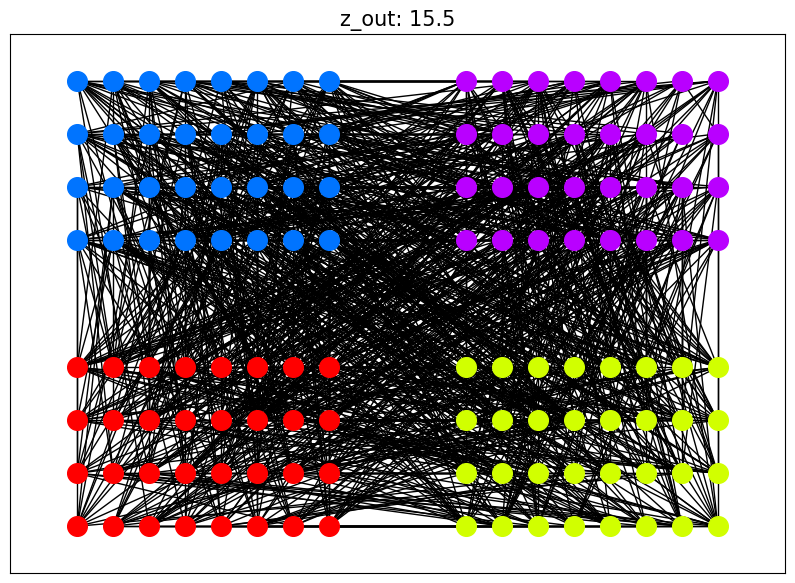

In [3]:
z_out = 15.5
plt.figure(figsize=(10, 7))
graph = generate_4_neighbors_graph(get_p_in(z_out))
graph_groups = get_graph_groups(graph)
custom_pos = get_custom_pos(graph)
draw_comms(graph, custom_pos, comms_set=graph_groups)

plt.title(f"z_out: {z_out}", fontsize=15)
plt.savefig(f"z_out-{z_out}.png", transparent=True)

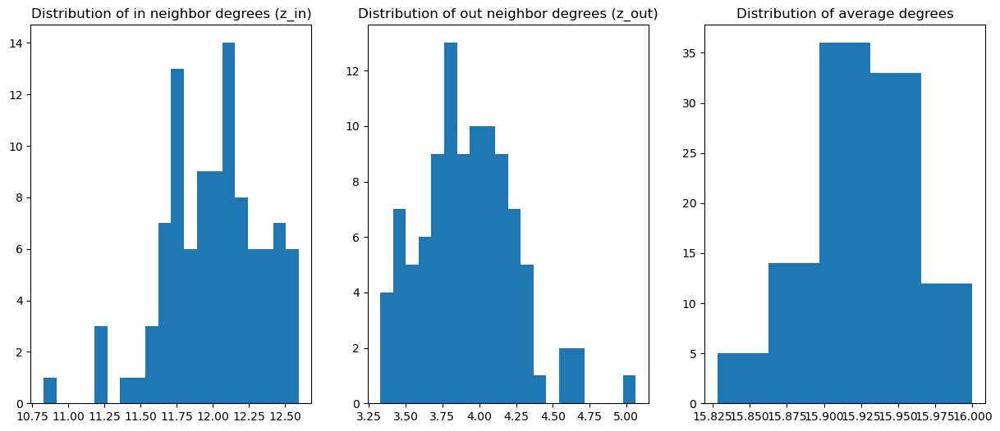

In [4]:
graphs = generates_graphs(100, z_out=4)

ind = []
ond = []
average_degrees = []

for graph in graphs:
    in_neighbor_degree, out_neighbor_degree = get_in_neighbor_degree(
        graph
    ), get_out_neighbor_degree(graph)
    average_degree = get_average_degree(graph)

    ind.append(in_neighbor_degree)
    ond.append(out_neighbor_degree)
    average_degrees.append(average_degree)

fig, axes = plt.subplots(1, 3, figsize=(15, 6))
axes[0].hist(ind, bins=20)
axes[0].set_title("Distribution of in neighbor degrees (z_in)")

axes[1].hist(ond, bins=20)
axes[1].set_title("Distribution of out neighbor degrees (z_out)")

axes[2].hist(average_degrees, bins=5)
axes[2].set_title("Distribution of average degrees")

plt.show()

In [5]:
z_outs = list(range(1, 16))
# z_outs = [0.5 + i*0.5 for i in range(31)]
louvain_ratios = []
surprise_communities_ratios = []
leiden_ratios = []
walktrap_ratios = []

louvain_comms_cnts = []
surprise_communities_comms_cnts = []
leiden_comms_cnts = []
walktrap_comms_cnts = []
N = 128

sim_n = 100
s = time.time()
for i in range(sim_n):
    if i % 10 == 0 or i + 1 == sim_n:
        print(f"{i/sim_n*100}%: {round(time.time()-s,2)}s")

    louvain_ratio = []
    surprise_communities_ratio = []
    leiden_ratio = []
    walktrap_ratio = []

    louvain_comms_cnt = []
    surprise_communities_comms_cnt = []
    leiden_comms_cnt = []
    walktrap_comms_cnt = []
    for z_out in z_outs:
        graph = generate_4_neighbors_graph(get_p_in(z_out=z_out))
        graph_groups = get_graph_groups(graph)

        louvain_coms = algorithms.louvain(graph)
        surprise_communities_coms = algorithms.surprise_communities(graph)
        leiden_coms = algorithms.leiden(graph)
        walktrap_coms = algorithms.walktrap(graph)

        louvain_ratio.append(
            adjusted_mutual_info_score(*get_labels(graph, louvain_coms))
        )
        surprise_communities_ratio.append(
            adjusted_mutual_info_score(*get_labels(graph, surprise_communities_coms))
        )
        leiden_ratio.append(adjusted_mutual_info_score(*get_labels(graph, leiden_coms)))
        walktrap_ratio.append(
            adjusted_mutual_info_score(*get_labels(graph, walktrap_coms))
        )

        louvain_comms_cnt.append(len(louvain_coms.communities))
        surprise_communities_comms_cnt.append(
            len(surprise_communities_coms.communities)
        )
        leiden_comms_cnt.append(len(leiden_coms.communities))
        walktrap_comms_cnt.append(len(walktrap_coms.communities))

    louvain_ratios.append(louvain_ratio)
    surprise_communities_ratios.append(surprise_communities_ratio)
    leiden_ratios.append(leiden_ratio)
    walktrap_ratios.append(walktrap_ratio)

    louvain_comms_cnts.append(louvain_comms_cnt)
    surprise_communities_comms_cnts.append(surprise_communities_comms_cnt)
    leiden_comms_cnts.append(leiden_comms_cnt)
    walktrap_comms_cnts.append(walktrap_comms_cnt)


louvain_ratio = np.mean(louvain_ratios, axis=0)
surprise_communities_ratio = np.mean(surprise_communities_ratios, axis=0)
leiden_ratio = np.mean(leiden_ratios, axis=0)
walktrap_ratio = np.mean(walktrap_ratios, axis=0)

louvain_comms_cnt = np.mean(louvain_comms_cnts, axis=0)
surprise_communities_comms_cnt = np.mean(surprise_communities_comms_cnts, axis=0)
leiden_comms_cnt = np.mean(leiden_comms_cnts, axis=0)
walktrap_comms_cnt = np.mean(walktrap_comms_cnts, axis=0)

0.0%: 0.0s
10.0%: 4.49s
20.0%: 9.05s
30.0%: 13.63s
40.0%: 18.19s
50.0%: 22.81s
60.0%: 27.35s
70.0%: 31.95s
80.0%: 36.53s
90.0%: 41.16s
99.0%: 45.26s


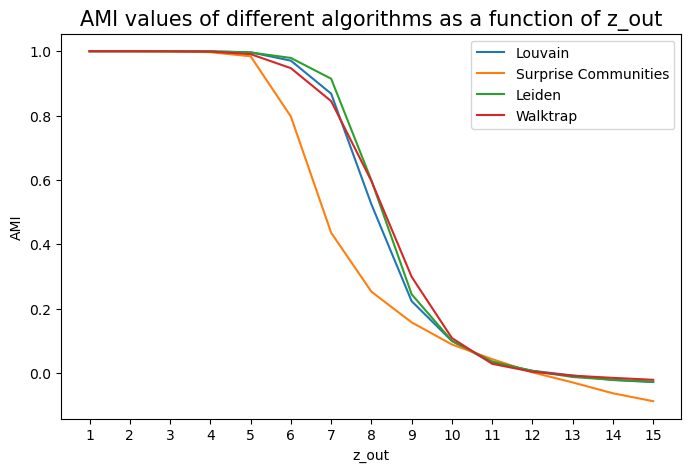

In [6]:
z_outs = list(range(1, 16))
plt.figure(figsize=(8, 5))
plt.plot(z_outs, louvain_ratio, label="Louvain")
plt.plot(z_outs, surprise_communities_ratio, label="Surprise Communities")
plt.plot(z_outs, leiden_ratio, label="Leiden")
plt.plot(z_outs, walktrap_ratio, label="Walktrap")
plt.xlabel("z_out")
plt.xticks(z_outs)
plt.ylabel("AMI")
plt.legend()
plt.title("AMI values of different algorithms as a function of z_out", fontsize=15)
plt.savefig("AMI as a function of z_out.png", transparent=True)

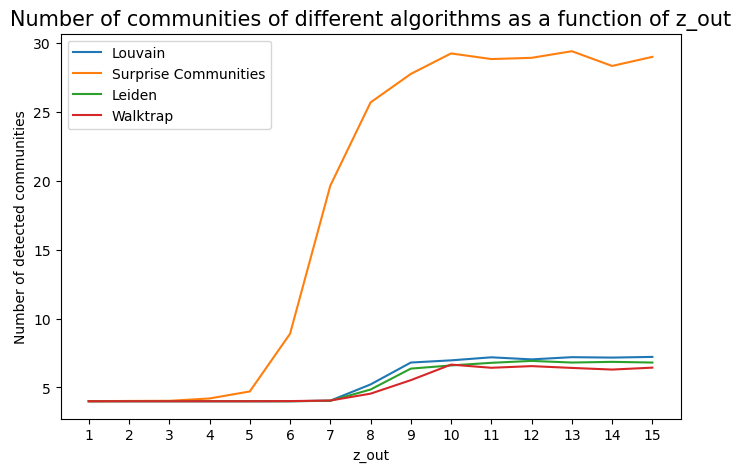

In [7]:
plt.figure(figsize=(8, 5))
plt.plot(z_outs, louvain_comms_cnt, label="Louvain")
plt.plot(z_outs, surprise_communities_comms_cnt, label="Surprise Communities")
plt.plot(z_outs, leiden_comms_cnt, label="Leiden")
plt.plot(z_outs, walktrap_comms_cnt, label="Walktrap")
plt.xlabel("z_out")
plt.xticks(z_outs)
plt.ylabel("Number of detected communities")
plt.legend()
plt.title(
    "Number of communities of different algorithms as a function of z_out", fontsize=15
)
plt.savefig("Comms cnt as a function of z_out.png", transparent=True)

Text(0.5, 1.0, 'Original communities: 4 comms')

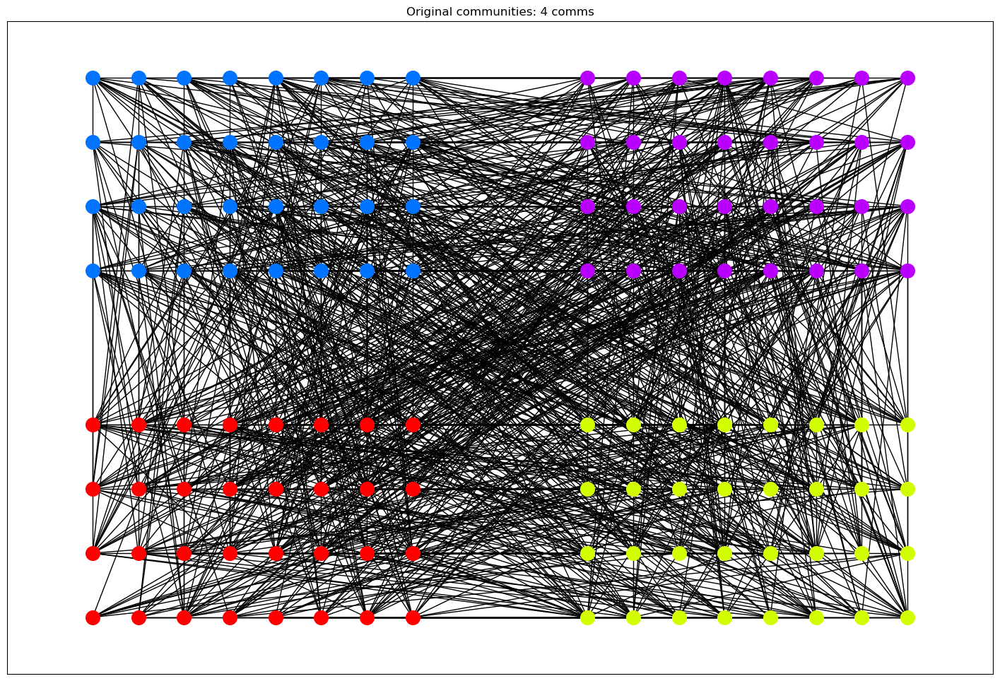

In [8]:
plt.figure(figsize=(18, 12))
comms_set = get_graph_groups(graph)
draw_comms(graph, custom_pos, comms_set=comms_set)
plt.title(f"Original communities: {len(graph_groups)} comms")

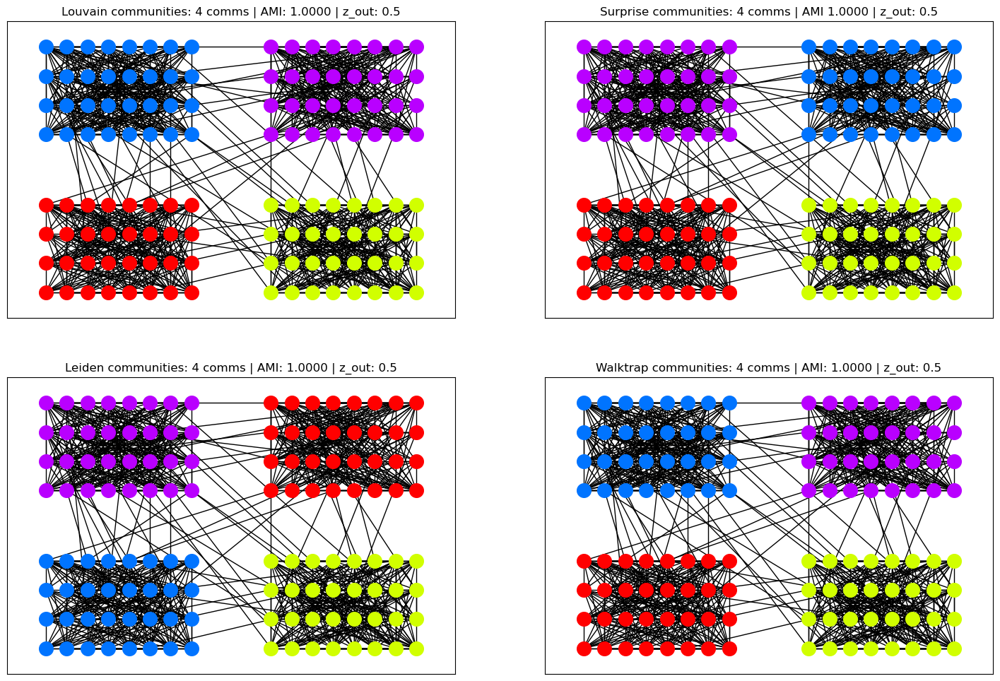

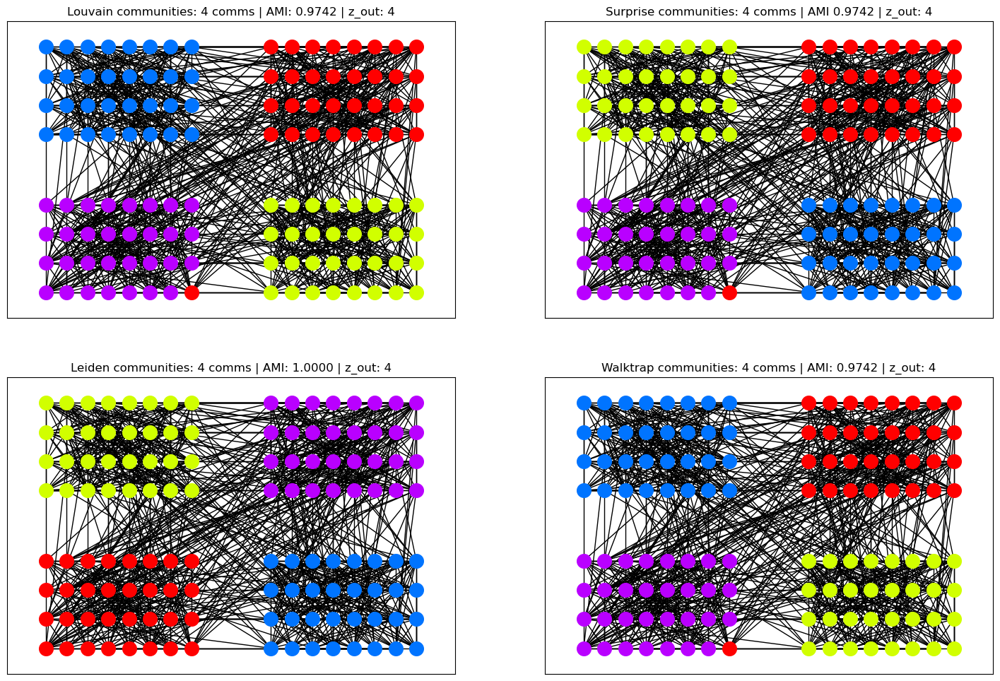

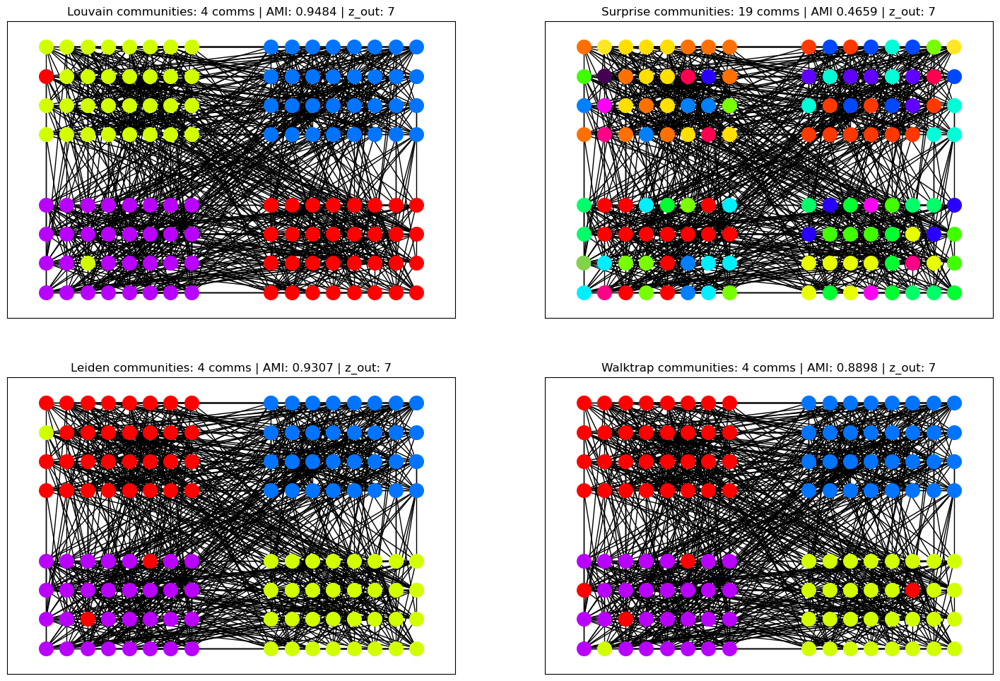

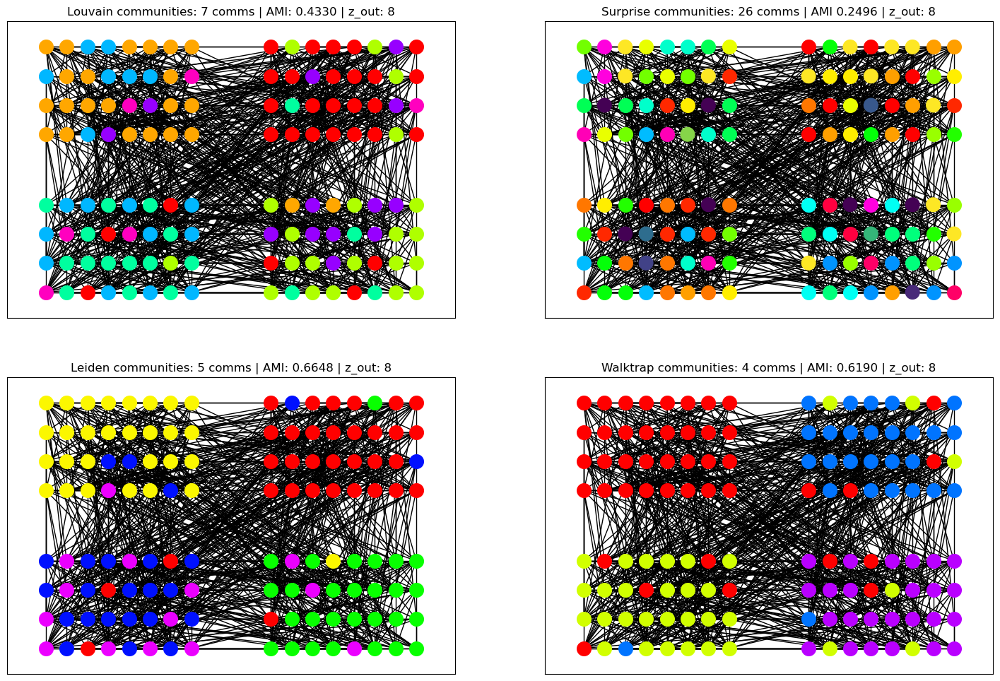

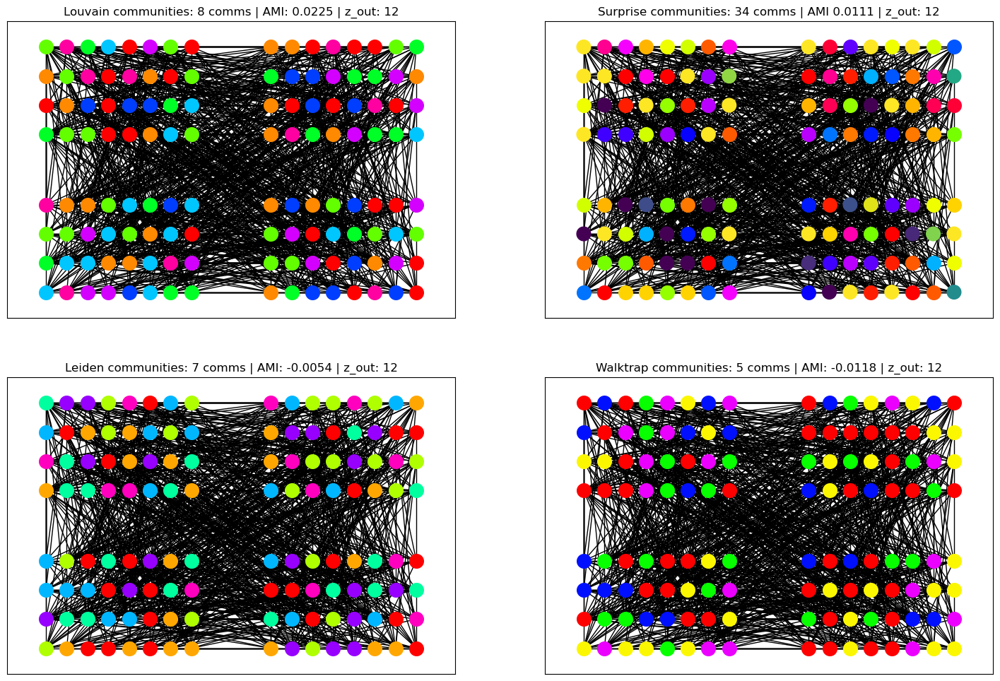

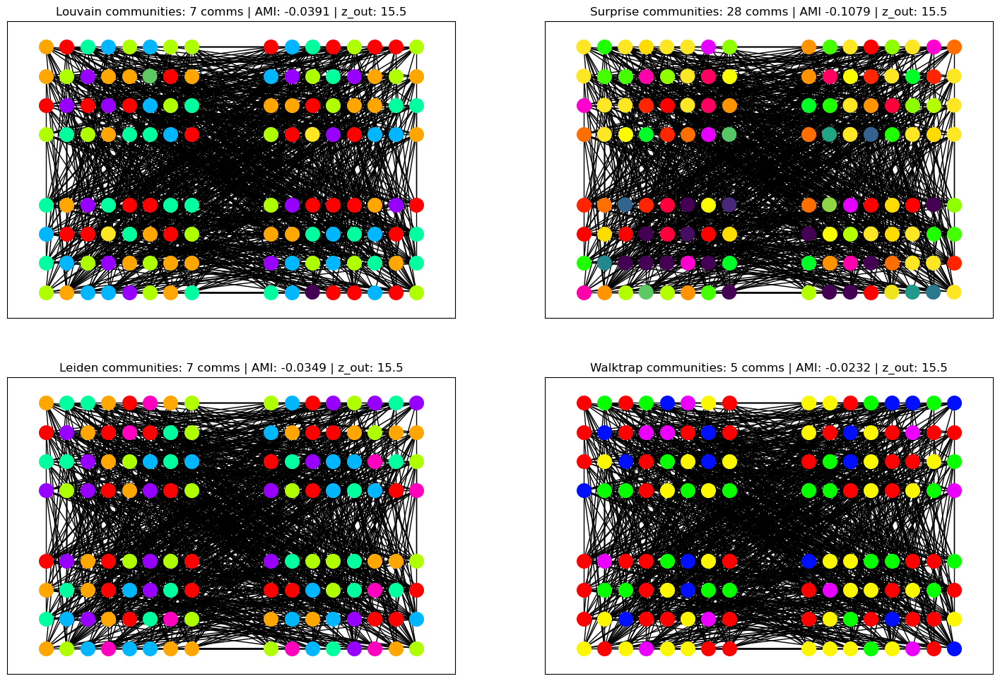

In [9]:
z_outs = [0.5, 4, 7, 8, 12, 15.5]
for z_out in z_outs:
    plt.figure(figsize=(18, 12))
    graph = generate_4_neighbors_graph(get_p_in(z_out))
    custom_pos = get_custom_pos(graph)

    plt.subplot(221)
    comms = algorithms.louvain(graph)
    ami = adjusted_mutual_info_score(*get_labels(graph, comms))
    draw_comms(graph, custom_pos, comms=comms)
    plt.title(
        f"Louvain communities: {len(comms.communities)} comms | AMI: {ami:.4f} | z_out: {z_out}"
    )

    plt.subplot(222)
    comms = algorithms.surprise_communities(graph)
    ami = adjusted_mutual_info_score(*get_labels(graph, comms))
    draw_comms(graph, custom_pos, comms=comms)
    plt.title(
        f"Surprise communities: {len(comms.communities)} comms | AMI {ami:.4f} | z_out: {z_out}"
    )

    plt.subplot(223)
    comms = algorithms.leiden(graph)
    ami = adjusted_mutual_info_score(*get_labels(graph, comms))
    draw_comms(graph, custom_pos, comms=comms)
    plt.title(
        f"Leiden communities: {len(comms.communities)} comms | AMI: {ami:.4f} | z_out: {z_out}"
    )

    plt.subplot(224)
    comms = algorithms.walktrap(graph)
    ami = adjusted_mutual_info_score(*get_labels(graph, comms))
    draw_comms(graph, custom_pos, comms=comms)
    plt.title(
        f"Walktrap communities: {len(comms.communities)} comms | AMI: {ami:.4f} | z_out: {z_out}"
    )

    plt.savefig(f"Figures of found communities_z_out-{z_out}.png", transparent=True)
    plt.show()
    plt.close()

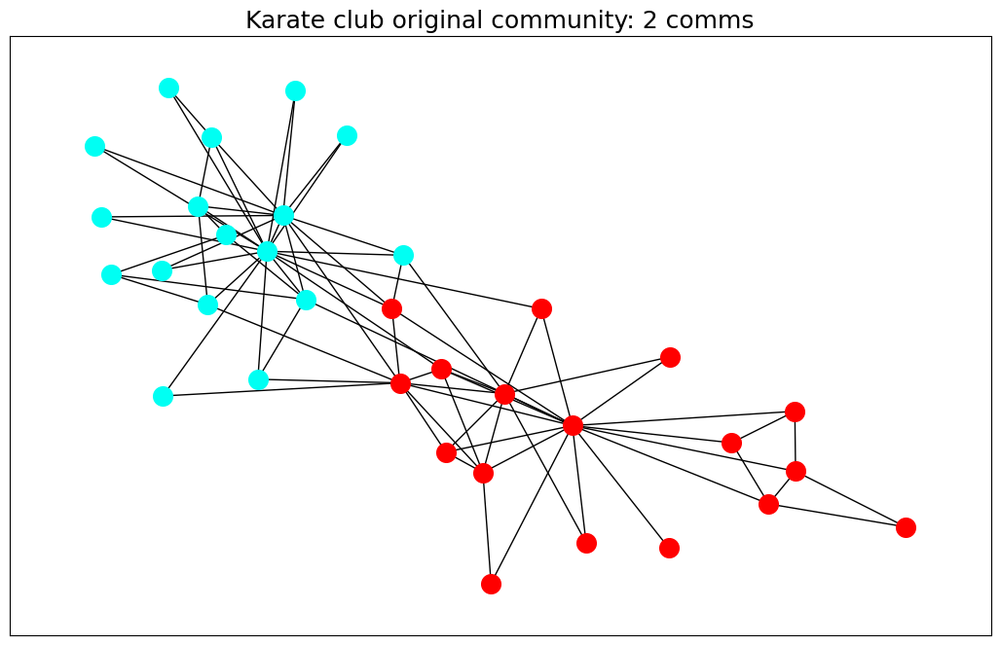

In [10]:
# %%time
plt.figure(figsize=(13, 8))

graph = nx.karate_club_graph()
clubs = {"Mr. Hi": 0, "Officer": 1}

labels = {}
for v in graph.nodes():
    labels[v] = clubs[graph.nodes[v]["club"]]

comms_set = get_comms_set_from_labels(labels)
pos = nx.layout.spring_layout(graph)
draw_comms(graph, pos, comms_set=comms_set)
plt.title(f"Karate club original community: {len(comms_set)} comms", fontsize=18)
plt.savefig("Original comms on Karate clubs.png", transparent=True)

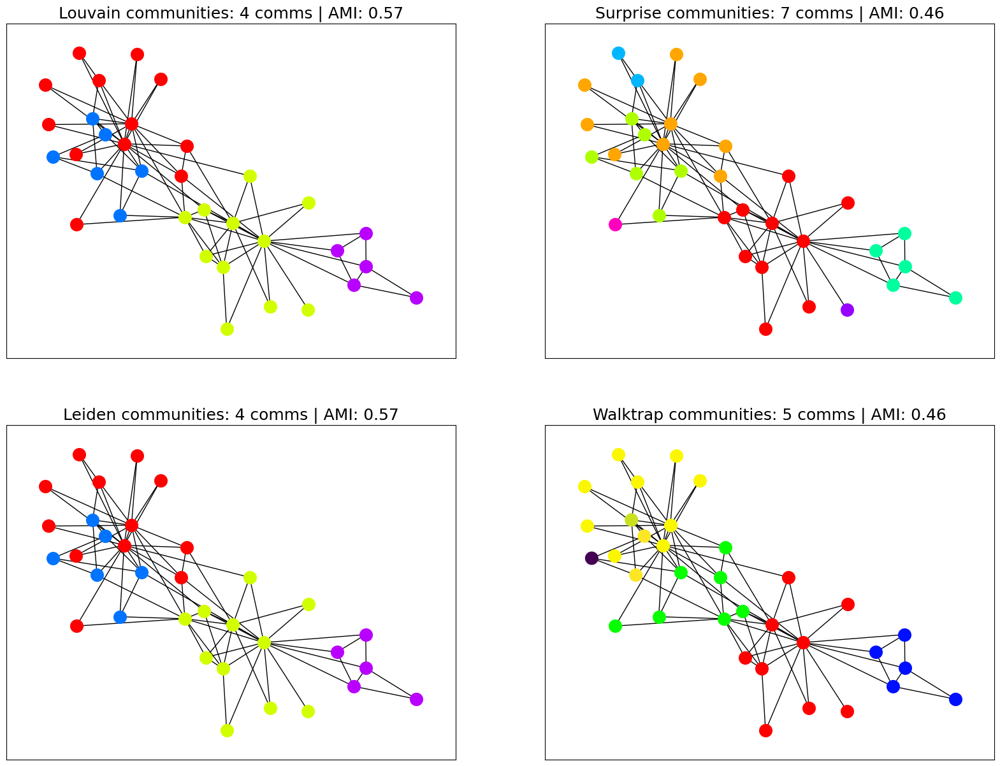

CPU times: user 632 ms, sys: 6.65 ms, total: 638 ms
Wall time: 638 ms


In [11]:
%%time

plt.figure(figsize=(20, 15))
plt.subplot(221)
comms = algorithms.louvain(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Louvain communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(222)
comms = algorithms.surprise_communities(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Surprise communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(223)
comms = algorithms.leiden(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Leiden communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(224)
comms = algorithms.walktrap(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Walktrap communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.savefig("Algorithms on Karate clubs.png", transparent=True)
plt.show()

CPU times: user 21.8 s, sys: 1.58 s, total: 23.4 s
Wall time: 23.5 s


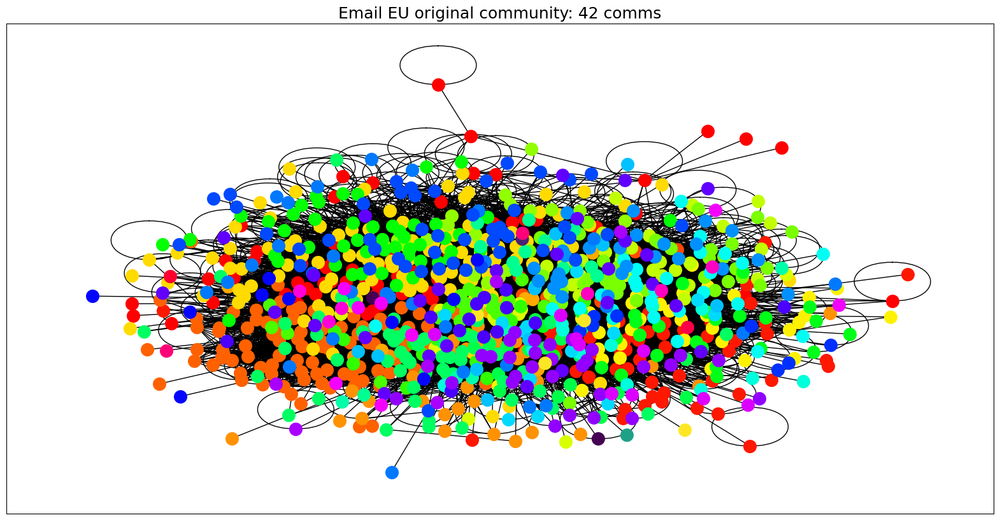

In [12]:
%%time
def read_communities_eu_email(file_path: str):
    res = {}
    lines = open(file_path).readlines()
    for line in lines:
        source, department = line.split()
        res[source] = int(department)
    return res


graph = nx.read_edgelist("data/email-Eu-core.txt")
labels = read_communities_eu_email("data/email-Eu-core-department-labels.txt")
pos = nx.layout.kamada_kawai_layout(graph)
comms_set = get_comms_set_from_labels(labels)

plt.figure(figsize=(20, 10))
draw_comms(graph, pos, comms_set=comms_set)
plt.title(f"Email EU original community: {len(comms_set)} comms", fontsize=18)
plt.savefig("Email_EU_originial.png", transparent=True)

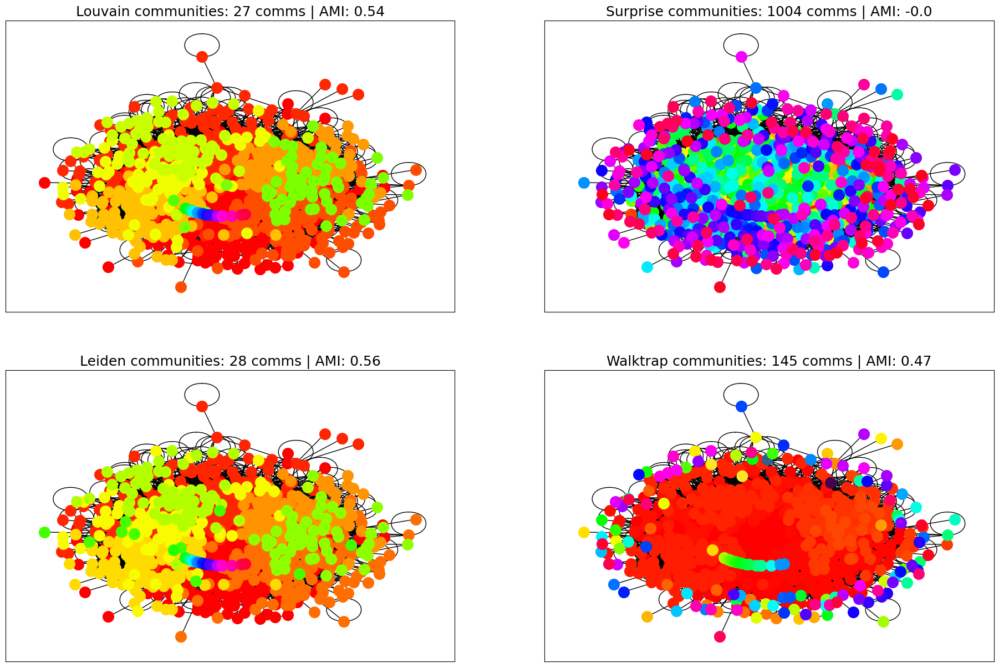

CPU times: user 15.1 s, sys: 3.35 ms, total: 15.1 s
Wall time: 15.2 s


In [13]:
%%time
plt.figure(figsize=(23, 15))

plt.subplot(221)
comms = algorithms.louvain(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Louvain communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(222)
comms = algorithms.surprise_communities(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Surprise communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(223)
comms = algorithms.leiden(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Leiden communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.subplot(224)
comms = algorithms.walktrap(graph)
ami = adjusted_mutual_info_score(
    *extract_labels_from_groups(labels, get_alg_comm_groups(comms))
)
draw_comms(graph, pos, comms=comms)
plt.title(
    f"Walktrap communities: {len(comms.communities)} comms | AMI: {round(ami, 2)}",
    fontsize=18,
)

plt.savefig("Algorithms on EU email.png", transparent=True)
plt.show()